<h1 align="center">The Fourier Transform.</h1>

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [41]:
from matplotlib import pyplot as plt
import scipy
from scipy.fftpack import fft, ifft, fft2, ifft2
import numpy as np
from scipy.io import wavfile
from IPython import display
from scipy import signal
import math
import imageio

In [42]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [43]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        #c
        self.rate = rate
        self.samples = samples
        

    def plot(self, d = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        if d:
            n = len(samples.real)
            seconds = n/rate
            dft = fft(samples)
            freq_domain = np.arange(0, n)
            frequencies = np.abs(dft / seconds)
            
            plt.subplot(121)
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Magnitude")
            plt.plot(freq_domain[:n//2], frequencies[:n//2])

            plt.subplot(122)
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Magnitude")
            plt.plot(freq_domain, frequencies)
            plt.show()
        else:

            ymax = 32768
            ymin = ymax * -1

            axes = plt.gca()
            axes.set_ylim([ymin,ymax])

            t = np.arange(1,len(self.samples)+1, 1)/self.rate
            s = self.samples

            plt.plot(t, s)
            plt.xlabel('time (s)')
            plt.ylabel('Magnitude (m)')
            plt.title('Sound Wave')
            plt.grid(True)
            plt.show()

    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """

        s = self.samples.real
        s_max = np.max(np.abs(self.samples))
        

        if s.dtype != np.int16 or force:
            s = ((s * 32767.)/s_max).astype(np.int16)

        wavfile.write(filename, self.rate, s)
        
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        
        if self.samples.shape != other.samples.shape:
            raise ValueError("Sample sizes are not compatible")
        
        return SoundWave(self.rate, self.samples + other.samples)

    
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #make sure sample rates are the same
        if self.rate != other.rate:
            raise ValueError("Sample rates are not equivalent")
        #append two reates together
        return SoundWave(self.rate, np.append(self.samples, other.samples))
    
    
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        
        #make sure the sample reates are the samle
        if self.rate != other.rate:
            raise ValueError("Sample rates are not equivalent")

        #check for difference in samples sizes and then padd the
        #smaller sample with zeros till they are the same size
        diff = abs(len(self.samples) - len(other.samples))
        if diff > 0:
            #figure out which samples array needs padding
            if len(self.samples) < len(other.samples):
                self.samples = np.append(self.samples, np.zeros(diff))
            else:
                other.samples = np.append(other.samples, np.zeros(diff))                    
        #preform fft of samples, convolve them circularly, then return the ifft
        convolution = ifft(np.multiply(fft(self.samples), fft(other.samples)))
        return SoundWave(self.rate, convolution)    
        

    
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #make sure sample rates are the same
        if self.rate != other.rate:
            raise ValueError("Sample rates are not equivalent")
        
        #get real parts of samples
        s1 = self.samples.real
        s2 = other.samples.real
        
        #figure out the smallest a such that
        #2^a >= m + l -1
        m = len(s1)
        n = len(s2)
        a = np.ceil(np.log2(m + n -1))
        l = 2**a
        
        v_bound = m + n -1
        d1 = int(l - m)
        d2 = int(l - n)
        
        #padd each vector with zeros till they have
        #length 2**a
        s1 = np.concatenate([s1, np.zeros(d1)])
        s2 = np.concatenate([s2, np.zeros(d2)])
        
        #preform fft of samples, convolve them linearly
        hp_s1_s2 = np.multiply(fft(s1), fft(s2))
        
        #preform ifft
        convolution = ifft(hp_s1_s2)
        
        return SoundWave(self.rate, convolution[:v_bound])

    
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        n = len(self.samples)
        r = self.rate
        #get bounds for frequency on the freq domain
        #frequency cooresponds to the index  i of fft which
        #cooresponds to ith root of unity with i zeroes
        l = math.floor((low_freq*n)/r)
        h = math.ceil((high_freq*n)/r) + 1
        
        #get frequency domain
        dft = fft(self.samples)
        #set range to zero
        dft[l:h] = np.zeros(h - l)
        
        #return ifft
        self.samples = ifft(dft)


- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

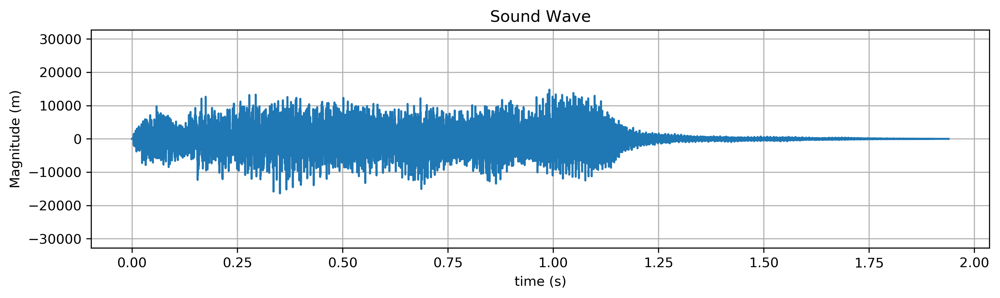

In [45]:
rate, samples = wavfile.read("tada.wav")
sw = SoundWave(rate, samples)
sw.plot()

- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling.
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [ ]:
sw.export("test1.wav")
sw.export("test2.wav", True)
display.Audio("tada.wav")

In [ ]:
display.Audio("test1.wav")


In [ ]:
display.Audio("test2.wav")

- Use `generate_note()` to create an A tone that lasts for two seconds

In [48]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    rate = 44100
    samples = np.linspace(0, 2*np.pi, rate*duration) 
    samples = np.sin(samples * frequency * 2 * np.pi)
    return SoundWave(rate,  samples)

In [49]:
A_freq = 440
filename = "test3.wav"

sw = generate_note(A_freq, 2)
sw.export(filename)
display.Audio(filename)

- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [50]:
A_freq = 440
C_freq = 523
E_freq = 659

filename = "test4.wav"

A_note = generate_note(A_freq, 3)
C_note = generate_note(C_freq, 3)
E_note = generate_note(E_freq, 3)

A_minor = A_note + C_note + E_note

A_minor.export(filename)
display.Audio(filename)

In [51]:
filename = "test5.wav"

A_note = generate_note(A_freq, 1)
C_note = generate_note(C_freq, 1)
E_note = generate_note(E_freq, 1)

arpeggio = A_note >> C_note >> E_note

arpeggio.export(filename)
display.Audio(filename)

- Implement a simple discrete fourier transform

In [52]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    m = np.arange(n).reshape(n,1)
    W_n = np.exp((-2j * np.pi/n) * m @ m.T)
    return W_n @ samples/n

In [53]:
size = 100
samples = np.random.randint(-32768, 32767, size, dtype=np.int16)
if not np.allclose(fft(samples), size * simple_dft(samples)):
    raise Exception("sample_dft is wrong")

- Implement a simple fast fourier transform

In [54]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    def split(g):   
        n = np.size(g)
        if n <= threshold:
            return n * simple_dft(g)
        else:
            even = split(g[::2])
            odd = split(g[1::2])
            z = np.zeros(n, dtype=complex)
            k = np.arange(n)
            z[k] = np.exp((-2 * np.pi * 1j * k)/n)
            m = n // 2
            return np.array(np.concatenate([even + np.multiply(z[:m], odd), even + np.multiply(z[m:], odd)]))
    return split(samples)/np.size(samples)

In [55]:
q = 8192
samples = np.random.randint(-32768, 32767, q, dtype=np.int16)
print("simple dft time: ")
%time simple_dft(samples)
print("simple fft time: ")
%time simp_f = simple_fft(samples)
print("fft time: ")
%time fftsamp = fft(samples)
print(np.allclose(q * simp_f, fftsamp))

simple dft time: 
CPU times: user 2.64 s, sys: 1.32 s, total: 3.95 s
Wall time: 4.71 s
simple fft time: 
CPU times: user 200 ms, sys: 4.46 ms, total: 205 ms
Wall time: 203 ms
fft time: 
CPU times: user 455 µs, sys: 157 µs, total: 612 µs
Wall time: 599 µs
True


When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Display the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

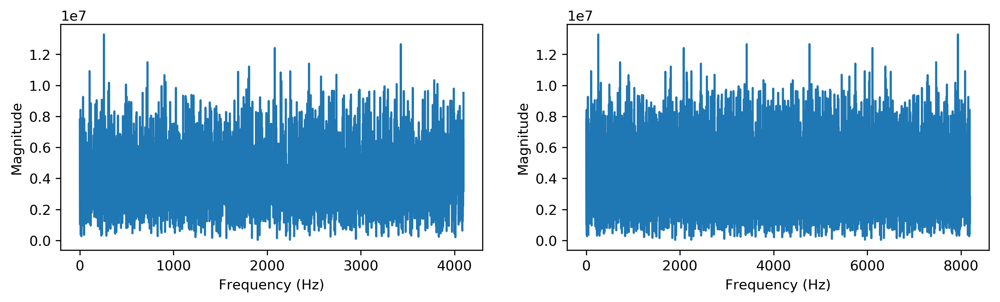

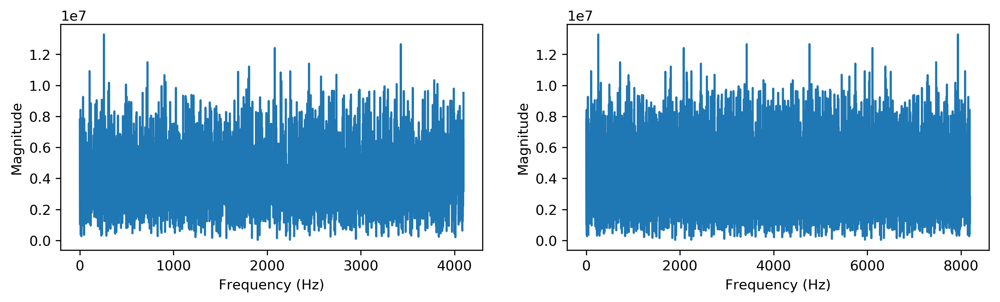

In [56]:
A_note = generate_note(A_freq, 1)
C_note = generate_note(C_freq, 1)
E_note = generate_note(E_freq, 1)

A_minor = A_note + C_note + E_note

A_note.plot(True)
A_minor.plot(True)

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [57]:
rate, samples = wavfile.read("mystery_chord.wav")
sw = SoundWave(rate, samples)

n = len(samples)//2
seconds = n/rate
dft = fft(samples)[:n]
freq_domain = np.arange(0, n)
frequencies = np.abs(dft / seconds)

lower_bound = max(frequencies)/2

inbounds = lambda x: x <= upper_bound and x >= lower_bound
chord = np.argwhere(frequencies >= lower_bound)

notes = {
    'A':440, 
    'B':493.88,
    'C':523.25,
    'D':587.33,
    'E':659.25,
    'F':698.46,
    'G':783.99,
}

def closest(freq):
    closest_note = "A"
    for i in notes:
        if abs(freq % notes[i]) < abs(freq % notes[closest_note]):
            closest_note = i

    return closest_note

print("Notes found in mystery chord: ")
for freq in chord:
    print(closest(freq))


Notes found in mystery chord: 
A
C
D
G


<h2 align="center">Part 2: Convolution and Filtering.</h2>

- Implement circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself.

In [ ]:
# Create 2 seconds of white noise at a given rate.
rate = 22050      
#generate white noise
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)
white_noise_sw = SoundWave(rate, white_noise)

In [ ]:
#get tada
rate, samples = wavfile.read("tada.wav")
tada_sw = SoundWave(rate, samples)

#convolute tada with white noise
conv = tada_sw * white_noise_sw
conv = conv >> conv

#export sound to hear
conv.export("conv.wav", True)
display.Audio("conv.wav")

- Implement linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav`

In [58]:
display.Audio("GCG.wav")

In [59]:
display.Audio("GCG.wav")

In [60]:
#get gcg
rate, samples = wavfile.read("GCG.wav")
gcg_swg = SoundWave(rate, samples)

#get cgc
rate, samples = wavfile.read("CGC.wav")
cgc_swc = SoundWave(rate, samples)

#calculate time of computing the custom convolve
print("Time for custom linear convolve:")
%time convolution = cgc_swc ** gcg_swg

#use soundwave class to export and view sound
convolution.export("cgc-gcg.wav", True)
display.Audio("cgc-gcg.wav")

Time for custom linear convolve:
CPU times: user 73.1 ms, sys: 16.7 ms, total: 89.7 ms
Wall time: 73.3 ms


In [61]:
#calculate times of computing the scipy convolve
print("Time for scipy.signal.fftconvolve:")
%time convolved_samples = signal.fftconvolve(cgc_swc.samples.real, gcg_swg.samples.real)

#use soundwave class to export and view sound
convolution = SoundWave(cgc_swc.rate, convolved_samples)
convolution.export("cgc-gcg-true.wav", True)
display.Audio("cgc-gcg-true.wav")

Time for scipy.signal.fftconvolve:
CPU times: user 18.7 ms, sys: 10.3 ms, total: 29 ms
Wall time: 18.1 ms


Compute the linear convolution of `chopin.wav` and `balloon.wav`.


In [62]:
#get chpin sound
rate, samples = wavfile.read("chopin.wav")
chopin_sw = SoundWave(rate, samples)

#get balloon sound
rate, samples = wavfile.read("balloon.wav")
baloon_sw = SoundWave(rate, samples)

#convolve sounds
convolution = baloon_sw ** chopin_sw

#use soundwoave class to view sound
convolution.export("balloon_chopin.wav", True)
display.Audio("balloon_chopin.wav")

- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`.

In [63]:
display.Audio("noisy1.wav")

In [64]:
#set frequency range
low = 1250
high = 2600

#get noisy sound
rate, samples = wavfile.read("noisy1.wav")
noisy1_sw = SoundWave(rate, samples)

#clean sound within given freq range
noisy1_sw.clean(low, high)

#use soundave class to listen
noisy1_sw.export("clean1.wav", True)
display.Audio("clean1.wav")

In [65]:
display.Audio("noisy2.wav")

In [66]:
#get noisy 2
rate, samples = wavfile.read("noisy2.wav")
noisy2_sw = SoundWave(rate, samples)

#clean sound within freq reqnge
noisy2_sw.clean(low, high)

#use soundwave calss to listen
noisy2_sw.export("clean2.wav", True)
display.Audio("clean2.wav")

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [67]:
display.Audio("vuvuzela.wav")

In [68]:
#get sound
rate, samples = wavfile.read("vuvuzela.wav")

#set freq range
low = 200
high = 500

#split apart sound channels
left_ch_sw = SoundWave(rate, samples[:,0])
right_ch_sw = SoundWave(rate, samples[:,1])

#clean each soundchannel individually
right_ch_sw.clean(low, high)
left_ch_sw.clean(low, high)

#scale down amplitude
s1_max = np.max(np.abs(right_ch_sw.samples))
s2_max = np.max(np.abs(left_ch_sw.samples))

s1 = ((right_ch_sw.samples.real * 32767.)/s1_max).astype(np.int16)
s2 = ((left_ch_sw.samples.real * 32767.)/s2_max).astype(np.int16)

#reconstruct sound matrix
clean_channels = np.vstack((s1, s2)).T

#listen with soundwave class
wavfile.write("vuvuzela_clean.wav", rate, clean_channels)
display.Audio("vuvuzela_clean.wav")

The year on the sticker is...